<a href="https://colab.research.google.com/github/yoonyerin/Text-Captcha-Recognition/blob/main/Text_captcha_recongnition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import random

import matplotlib.pyplot as plt
import numpy as np

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import DataLoader,Dataset
from torch.autograd import Variable
from PIL import Image

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   


## DATA LOAD

In [ ]:
NUMBER = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
ALPHABET = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
NONE = ['NONE'] # label for empty space
ALL_CHAR_SET = NUMBER + ALPHABET + NONE
ALL_CHAR_SET_LEN = len(ALL_CHAR_SET)
MAX_CAPTCHA = 7



# one-hot encoding
def encode(a):
    onehot = [0]*ALL_CHAR_SET_LEN
    idx = ALL_CHAR_SET.index(a)
    onehot[idx] += 1
    return onehot

36


In [ ]:
'''Define TRAIN_SIZE and TEST_SIZE'''
TRAIN_SIZE = 10000
TEST_SIZE = 1000

In [ ]:
# modified dataset class
import natsort
class Mydataset(Dataset):
    def __init__(self, img_path, label_path, is_train=True, transform=None):
        self.path = img_path
        self.label_path = label_path
        if is_train: 
            self.img = natsort.natsorted(os.listdir(self.path))[:TRAIN_SIZE]        
            self.labels = open(self.label_path, 'r').read().split('\n')[:-1][:TRAIN_SIZE]
        else: 
            self.img = natsort.natsorted(os.listdir(self.path))[:TEST_SIZE]
            self.labels = open(self.label_path, 'r').read().split('\n')[:-1][:TEST_SIZE]
        
        self.transform = transform
        self.max_length = MAX_CAPTCHA
        
    def __getitem__(self, idx):
        img_path = self.img[idx]
        img = Image.open(f'{self.path}/{idx}.png')

        img = img.convert('L')
        label = self.labels[idx]
        label_oh = []
        
        # one-hot for each character
        for i in range(self.max_length):
            if i < len(label):
                label_oh += encode(label[i])
            else:
                label_oh += encode('NONE')
            
        if self.transform is not None:
            img = self.transform(img)
        return img, np.array(label_oh), label
    
    def __len__(self):
        return len(self.img)

In [ ]:
transform = transforms.Compose([
    transforms.Resize([160, 60]),           # resize data
    transforms.ToTensor(),                  # convert input data into a tensor format
    transforms.Normalize((0.5, ), (0.5, ))     
])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from torch.utils.data import random_split
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

'''CHANGE to your own data folder path!
   SPLIT train set to train and validation, Use test set after training model'''
   
   
   #기존 코드 변경(주소)
train_ds = Mydataset('/content/drive/MyDrive/final_project/Data/Data/train', '/content/drive/MyDrive/final_project/Data/Data/train.txt',transform=transform)

test_ds = Mydataset('/content/drive/MyDrive/final_project/Data/Data/test', '/content/drive/MyDrive/final_project/Data/Data/train.txt',False, transform)

#train_ds = Mydataset('/content/drive/MyDrive/Data/Data/train', '/content/drive/MyDrive/Data/Data/train.txt',transform=transform)
#test_ds = Mydataset('/content/drive/MyDrive/Data/Data/test', '/content/drive/MyDrive/Data/Data/test.txt',False, transform)

#train data와 validation data 분리

data_size = len(train_ds)
train_size = int(data_size * 0.8)
validation_size = int(data_size * 0.2)

train_ds, validation_ds= random_split(train_ds, [train_size, validation_size])

train_dl = DataLoader(train_ds, batch_size=128, num_workers=4)
validation_dl = DataLoader(validation_ds, batch_size=128, num_workers=4)
test_dl = DataLoader(test_ds, batch_size=1, num_workers=4)




/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


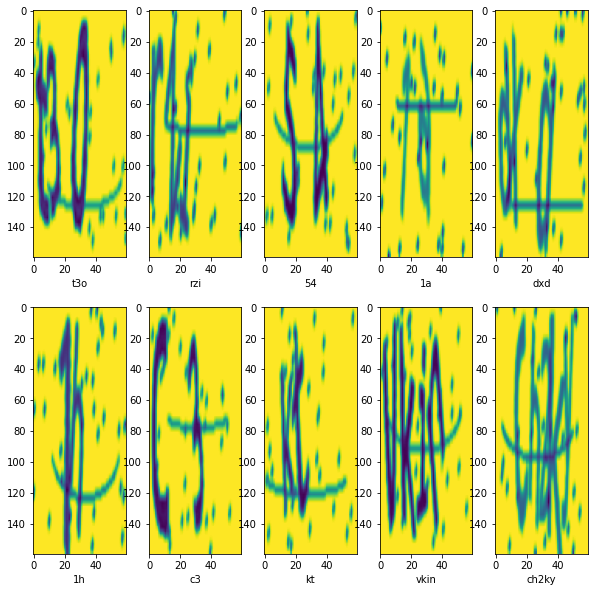

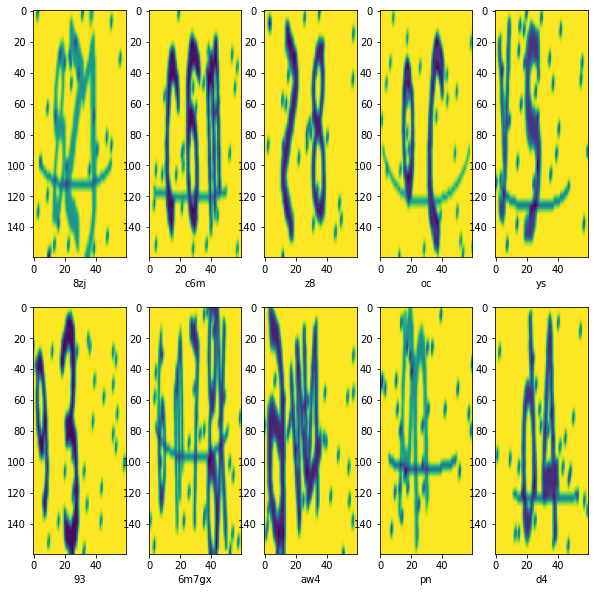

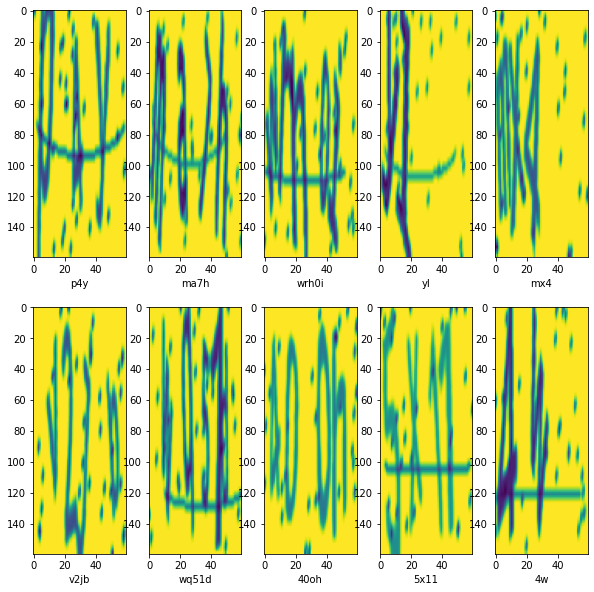

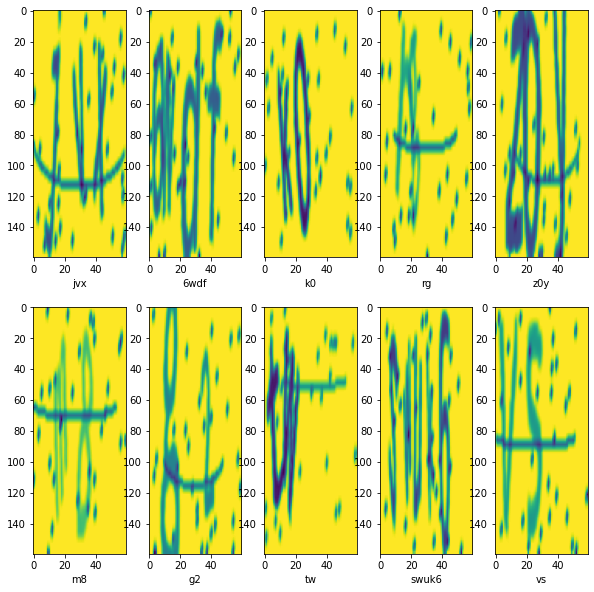

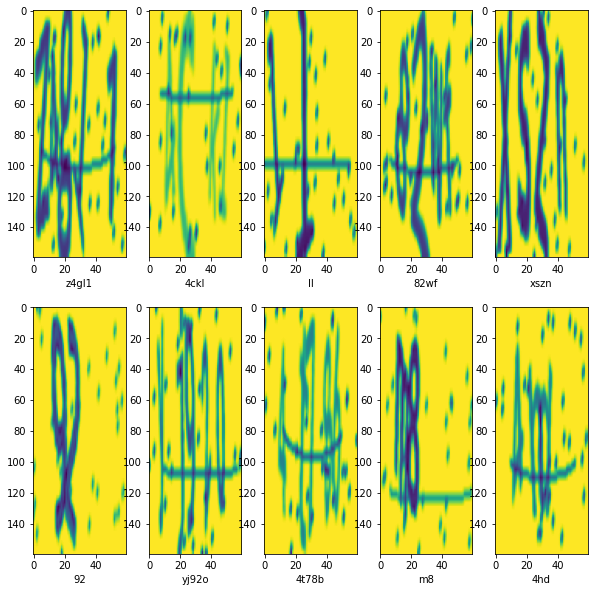

...

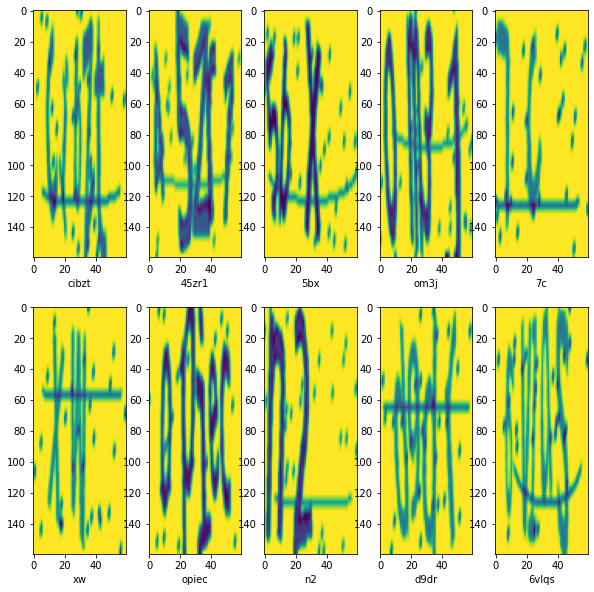

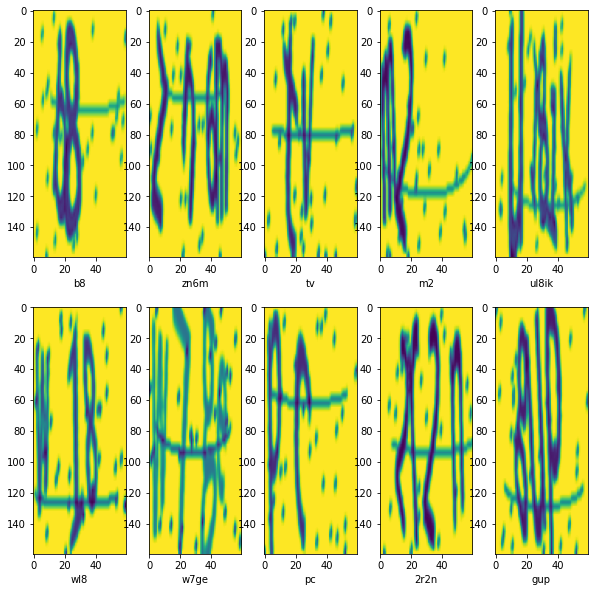

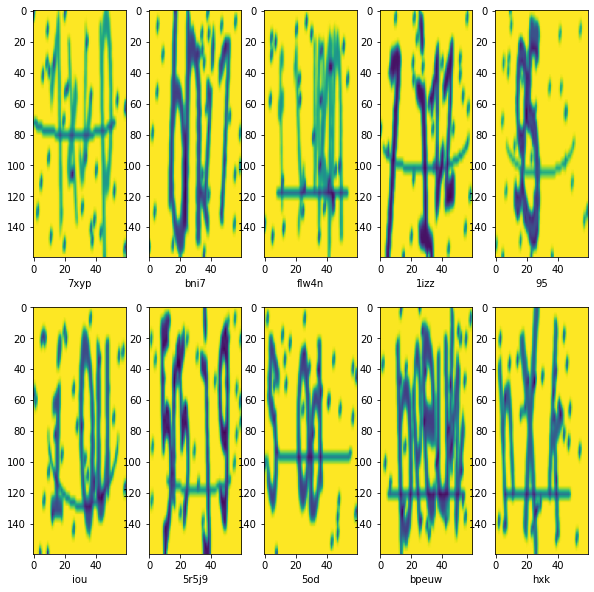

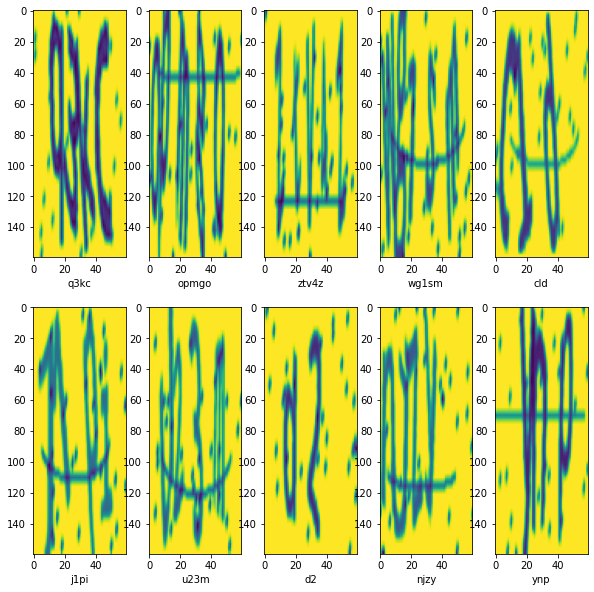

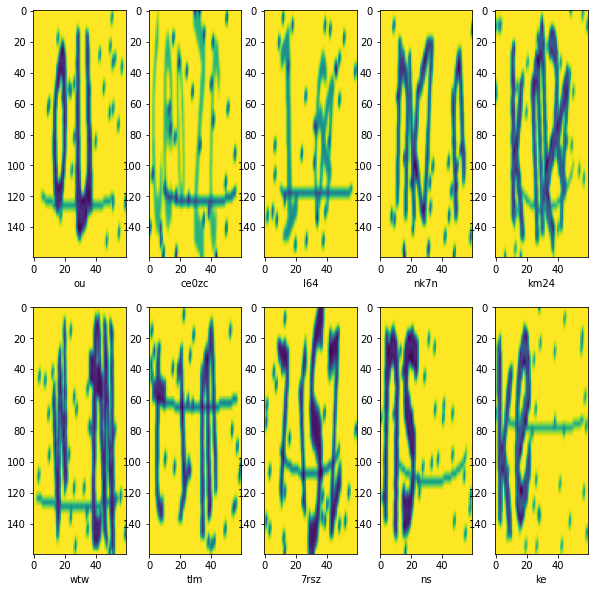

In [ ]:

for i, num in enumerate(train_dl):
    img, label_oh, label = num
    fig, axs=plt.subplots(2, 5, figsize=(10, 10))
    for i in range(2):
      for j in range(5):
        axs[i,j].imshow((img[5*i+j,:,:]).squeeze())
        axs[i,j].set_xlabel(label[5*i+j])
    
plt.show()

## Models

In [ ]:

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
import resnet

Net = resnet.resnet18(pretrained=True)
Net.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
Net.fc = nn.Linear(in_features=512, out_features=ALL_CHAR_SET_LEN*MAX_CAPTCHA, bias=True)
Net = Net.to(device)


In [ ]:
#LSTM 
class LSTM(nn.Module):
    def __init__(self, cnn_dim, hidden_size, vocab_size, num_layers=1):
        super(LSTM, self).__init__()
    
        self.cnn_dim = cnn_dim
        self.hidden_size = hidden_size   
        self.vocab_size = vocab_size
        

        self.lstm_cell = nn.LSTMCell(input_size=self.vocab_size, hidden_size=hidden_size)

        
        # output fully connected layer  ALL_CHAR_SET_LEN*MAX_C
        self.fc_in =  nn.Linear(in_features=2, out_features=vocab_size, bias=True) 
        self.fc_out =  nn.Linear(in_features=self.hidden_size, out_features=ALL_CHAR_SET_LEN*MAX_CAPTCHA, bias=True)
        #ALL_CHAR_SET_LEN*MAX_CAPTCHA로 바꾸기
    
        
     
        # embedding layer
        self.embed = nn.Embedding(num_embeddings=self.vocab_size, embedding_dim=self.vocab_size)
    #
        # activations
        self.softmax = nn.Softmax(dim=1)
#label_oh.view(batch_size,MAX_CAPTCHA,ALL_CHAR_SET_LEN).argmax(dim=2)

    def forward(self, features, captions): ## features: cnn에서 온 출력값 , captions: 
        batch_size = features.size(0)
        cnn_dim = features.size(1)
        # seqlen(7) barchsize, hidden size
        hidden_state = torch.zeros((batch_size, self.hidden_size)).cuda()  # Initialize hidden state with zeros
        cell_state = torch.zeros((batch_size, self.hidden_size)).cuda()   # Initialize cell state with zeros

        outputs = torch.empty((batch_size, captions.size(1), self.vocab_size)).cuda()   
        captions_embed = self.embed(captions)#글자들의 집합들을 임베딩 # 128, 259*7

        #captions.size(1)= 실제 글자 개수
       '''Problem1: Design LSTM model for captcha image recognition'''
        for t in range(captions.size(1)):#sequence의 길이만큼 반복 (time step)
            
            # for the first time step the input is the feature vector
            if t == 0:              
              
              input=self.fc_in(features) #128 512 5 37 => resnet feature를 LSTM과 연결
              input=input.view(batch_size, 37, -1) # 37 128 ()

              fc_middle=nn.Linear(in_features=input.shape[2], out_features=7, bias=False).cuda() #128 37 7 
              
              input=fc_middle(input)
              #input=torch.transpose(input, 0, 2)#7 128 37


              if(batch_size!=1):
                input_box=input[:, :,t].squeeze()
              else:
                input_box=input[:, :, t]

              hidden_state, cell_state=self.lstm_cell(input_box, (hidden_state, cell_state))
              #hidden_state=(128, 128)#input은 128, 37)
            # for the 2nd+ time steps
            else:#두번째 이후부터의  hidden_State와 cell_state

              if(batch_size!=1):
                input_box=input[:, :,t].squeeze()
              else:
                input_box=input[:, :, t]

              hidden_state, cell_state=self.lstm_cell(input_box, (hidden_state, cell_state))
            outputs =self.softmax(self.fc_out(hidden_state)) # 확률값으로 변경
              

            # build the output tensor


        return outputs  # 정답으로 예측한 값

In [ ]:
cnn_dim=512   #resnet18-512
hidden_size=128   
vocab_size=37     #ALL_CHAR_SET_LEN

lstm = LSTM(cnn_dim=cnn_dim, hidden_size=hidden_size, vocab_size=vocab_size)
lstm = lstm.to(device)

In [ ]:
print(lstm)

LSTM(
  (lstm_cell): LSTMCell(37, 128)
  (fc_in): Linear(in_features=2, out_features=37, bias=True)
  (fc_out): Linear(in_features=128, out_features=259, bias=True)
  (embed): Embedding(37, 37)
  (softmax): Softmax(dim=1)
)


In [ ]:
'''DEFINE loss, optimizer'''

loss_func = nn.MultiLabelSoftMarginLoss()
#loss_func=nn.CrossEntropyLoss
cnn_optim = torch.optim.Adam(Net.parameters(), lr=0.001)
lstm_optim =  torch.optim.Adam(lstm.parameters(), lr=0.001)


## TRAIN

In [ ]:
import numpy as np
print_interval = 15
max_epoch = 30
use_lstm =True #lstm 사용
tf_rate = 1
train_loss=0.0
valid_loss=0.0
min_valid_loss=np.inf

for epoch in range(max_epoch):
    for step, i in enumerate(train_dl):
        img, label_oh, label = i
        img = Variable(img).cuda()
        label_oh = Variable(label_oh.float()).cuda() 
        batch_size, _ = label_oh.shape
        pred, feature = Net(img) # 128 259 /128 512 5 2 batchsize width height channel  128 
        # batch  size cnn dim,  , 
       if use_lstm:
           
          pred = lstm(feature, label_oh.view(batch_size,MAX_CAPTCHA,ALL_CHAR_SET_LEN).argmax(dim=2))
           
        loss = loss_func(pred, label_oh) #label_oh: 128 259
    
        cnn_optim.zero_grad()
        #lstm_optim.zero_grad()   
        loss.backward()         
        cnn_optim.step()
        #lstm_optim.step()
        if (step+1)%print_interval == 0:
            print('epoch:', epoch+1, 'step:', step+1, 'loss:', loss.item())

    lstm.eval()     # Optional when not using Model Specific layer
    
    #validation data 사용
    for step, i in enumerate(validation_dl):
        if torch.cuda.is_available():
            img, label_oh, label = i
        
        img = Variable(img).cuda()
        label_oh = Variable(label_oh.float()).cuda() 
        batch_size, _ = label_oh.shape
        pred, feature = Net(img) # 128 259 /128 512 5 2 batchsize width height channel  128 
        if use_lstm:           
          pred = lstm(feature, label_oh.view(batch_size,MAX_CAPTCHA,ALL_CHAR_SET_LEN).argmax(dim=2))
      
        valid_loss = loss_func(pred,label_oh)
        #print('Epoch' ,epoch+1, 'Validation Loss:',valid_loss )
    if min_valid_loss > valid_loss:
        print('Validation Loss Decreased. min_valid_loss:', min_valid_loss, '--->valid_loss: ', valid_loss )
        min_valid_loss = valid_loss


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


epoch: 1 step: 15 loss: 0.694977879524231
epoch: 1 step: 30 loss: 0.6949777603149414
epoch: 1 step: 45 loss: 0.6949781179428101
epoch: 1 step: 60 loss: 0.6949771642684937
Validation Loss Decreased. min_valid_loss: inf --->valid_loss:  tensor(0.6950, device='cuda:0', grad_fn=<MeanBackward0>)
epoch: 2 step: 15 loss: 0.6949770450592041
epoch: 2 step: 30 loss: 0.6949776411056519
epoch: 2 step: 45 loss: 0.6949767470359802
epoch: 2 step: 60 loss: 0.694977879524231
Validation Loss Decreased. min_valid_loss: tensor(0.6950, device='cuda:0', grad_fn=<MeanBackward0>) --->valid_loss:  tensor(0.6950, device='cuda:0', grad_fn=<MeanBackward0>)
epoch: 3 step: 15 loss: 0.6949777007102966
epoch: 3 step: 30 loss: 0.694977879524231
epoch: 3 step: 45 loss: 0.6949779391288757
epoch: 3 step: 60 loss: 0.694977343082428
Validation Loss Decreased. min_valid_loss: tensor(0.6950, device='cuda:0', grad_fn=<MeanBackward0>) --->valid_loss:  tensor(0.6950, device='cuda:0', grad_fn=<MeanBackward0>)
epoch: 4 step: 15 l

In [ ]:
lstm.parameters

<bound method Module.parameters of LSTM(
  (lstm_cell): LSTMCell(37, 128)
  (fc_in): Linear(in_features=2, out_features=37, bias=True)
  (fc_out): Linear(in_features=128, out_features=259, bias=True)
  (embed): Embedding(37, 37)
  (softmax): Softmax(dim=1)
)>

## TEST

In [ ]:
use_lstm = True
tf_rate = 0
char_correct = 0
word_correct = 0
total = 0

Net.eval()
lstm.eval()

def get_str(ch_arr):
    ch_str = ''
    for ch in ch_arr:
        if ch == 'NONE':
            ch_str = ch_str + '_'
        else:
            ch_str = ch_str + ch
    return ch_str

with torch.no_grad(): 
    for step, (img, label_oh, label) in enumerate(test_dl):
        img = Variable(img).cuda()  
        label_oh = Variable(label_oh.float()).cuda()
        pred, feature = Net(img)
        
        if use_lstm:
            outputs = lstm(feature, label_oh.view(1,MAX_CAPTCHA,ALL_CHAR_SET_LEN).argmax(dim=2))
            pred = outputs.view(1, -1) 
        pred = pred.squeeze(0)
        label_oh = label_oh.squeeze(0)
        
        c0 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[0:ALL_CHAR_SET_LEN])]
        c1 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[ALL_CHAR_SET_LEN:ALL_CHAR_SET_LEN*2])]
        c2 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[ALL_CHAR_SET_LEN*2:ALL_CHAR_SET_LEN*3])]
        c3 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[ALL_CHAR_SET_LEN*3:ALL_CHAR_SET_LEN*4])]
        c4 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[ALL_CHAR_SET_LEN*4:ALL_CHAR_SET_LEN*5])]
        c5 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[ALL_CHAR_SET_LEN*5:ALL_CHAR_SET_LEN*6])]
        c6 = ALL_CHAR_SET[np.argmax(pred.squeeze().cpu().tolist()[ALL_CHAR_SET_LEN*6:ALL_CHAR_SET_LEN*7])]
    
        d0 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[0:ALL_CHAR_SET_LEN])]
        d1 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[ALL_CHAR_SET_LEN:ALL_CHAR_SET_LEN*2])]
        d2 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[ALL_CHAR_SET_LEN*2:ALL_CHAR_SET_LEN*3])]
        d3 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[ALL_CHAR_SET_LEN*3:ALL_CHAR_SET_LEN*4])]
        d4 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[ALL_CHAR_SET_LEN*4:ALL_CHAR_SET_LEN*5])]
        d5 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[ALL_CHAR_SET_LEN*5:ALL_CHAR_SET_LEN*6])]
        d6 = ALL_CHAR_SET[np.argmax(label_oh.cpu().tolist()[ALL_CHAR_SET_LEN*6:ALL_CHAR_SET_LEN*7])]
        
        c_arr = (c0, c1, c2, c3, c4, c5, c6)
        d_arr = (d0, d1, d2, d3, d4, d5, d6)
    
        c = '%s%s%s%s%s%s%s' % (c0, c1, c2, c3, c4, c5, c6)
        d = '%s%s%s%s%s%s%s' % (d0, d1, d2, d3, d4, d5, d6)
    
        c = get_str(c_arr)
        d = get_str(d_arr)

        char_correct += (c0==d0)+(c1==d1)+(c2==d2)+(c3==d3)+(c4==d4)+(c5==d5)+(c6==d6)
        word_correct += (c==d)
        total += 1
        
        print('label:', d, ', pred:', c)
        if (step+1)%1 == 0:
            print('epoch:', epoch+1, 'step:', step+1, 'loss:', loss.item())
        
print(100/7*char_correct/total)
print(100*word_correct/total)

"""END TEST"""

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


label: yib8___ , pred: qsqo87r
epoch: 30 step: 1 loss: 0.6949772834777832
label: 2vb____ , pred: 8swoa3y
epoch: 30 step: 2 loss: 0.6949772834777832
label: ho4____ , pred: 86uoq7s
epoch: 30 step: 3 loss: 0.6949772834777832
label: chjr___ , pred: 8kgox7j
epoch: 30 step: 4 loss: 0.6949772834777832
label: teh7___ , pred: qkqiy7r
epoch: 30 step: 5 loss: 0.6949772834777832
label: 9xjr___ , pred: qkqox7u
epoch: 30 step: 6 loss: 0.6949772834777832
label: ku_____ , pred: 8sqiy7r
epoch: 30 step: 7 loss: 0.6949772834777832
label: pvdnt__ , pred: 86qoy7j
epoch: 30 step: 8 loss: 0.6949772834777832
label: jy_____ , pred: hkqow7j
epoch: 30 step: 9 loss: 0.6949772834777832
label: o2g____ , pred: qsqiarf
epoch: 30 step: 10 loss: 0.6949772834777832
label: xc_____ , pred: q6qod7u
epoch: 30 step: 11 loss: 0.6949772834777832
label: cal____ , pred: 86qoq7r
epoch: 30 step: 12 loss: 0.6949772834777832
label: 2jgx___ , pred: hstiize
epoch: 30 step: 13 loss: 0.6949772834777832
label: os_____ , pred: qkuow7y
epo

'END TEST'